
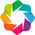

holoviews  1.8.4, plotly enabled


In [1]:
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns;# sns.set_palette('colorblind'); sns.set_color_codes(); sns.set_style('white')
#plt.style.use('classic')

if False:
    import sys
    hv_dev = '1.8.4'
    sys.path.insert(0, '/usr/lib/python3.6/site-packages/holoviews-' + hv_dev + '-py3.6.egg/')
else: hv_dev = ''

import holoviews as hv
from holoviews.plotting import plotly

import datashader as ds
from holoviews.operation.datashader import aggregate, shade, datashade, dynspread
from holoviews.operation import decimate

hv.notebook_extension('bokeh', 'matplotlib','plotly')

import param
import paramnb

import numpy as np
import pandas as pd
from time import sleep

import scipy.stats as stats
print('holoviews %s %s, plotly enabled'% (hv_dev, hv.__version__))

##### Reshaping arrays for speed

In [3]:
%%opts Path [width=500 tools=['pan','box_zoom','wheel_zoom','save','hover','reset']] (alpha=0.3 color='darkred')
%%opts Overlay [legend_position='top']
n_data  = 10
n_paths = 50
x_vals  = np.linspace(1,n_data,n_data)
values  = np.random.normal(size=(n_data,n_paths))
# Could plot each path i with:  hv.Scatter( (x_vals, values[:,i])) # see below!

lbl     = 'Normally distributed random points'
h       = hv.Scatter((np.repeat(x_vals, n_paths), values.flatten()), label=lbl) * \
          hv.Path((x_vals, values))
h       = h.redim.range(x=(0,11), y=(-3,3))
h.relabel(label="Path has a constructor that Scatter doesn't")

:Overlay
   .Scatter.Normally_distributed_random_points :Scatter   [x]   (y)
   .Path.I                                     :Path   [x,y]

If we use NdOverlay instead, the performance is **MUCH** worse:

In [4]:
%%opts Curve [width=500 ] (alpha=0.3 color='darkred' linewidth=1)
%%opts NdOverlay [legend_position='top' tools=['pan','box_zoom','wheel_zoom','save','reset']]

h = hv.NdOverlay( {i: hv.Scatter( (x_vals, values[:,i]) ) *\
                  hv.Curve((x_vals, values[:,i])  ) \
                  for i in range(n_paths)} )
h       = h.redim.range(x=(0,11), y=(-3,3))
h.relabel(label="NdOverlay with Curve is slow and the style is inconsistent!...")
h

:NdOverlay   [Element]
   :Overlay
      .Scatter.I :Scatter   [x]   (y)
      .Curve.I   :Curve   [x]   (y)

In [5]:
%%opts Curve [width=300 ] (alpha=0.3 color='darkred' linewidth=1)

# The NdOverlay has it's own dimensions one can slice or index on, an Overlay does not.
# So NdOverlay h[:, :3] translates to:
#   "get all the objects in the NdOverlay and
#    slice any value up to 3 along the x-axis of the Curves".
# With an Overlay the slicing applies directly to the Curve,
#    so Overlay h[:, :3] translates to
#    "slice all the samples along the x-axis and any value below 3 along the y-axis".
# Basically .dimensions() tells which dimensions one is actually slicing on:
#    h[0,0:8,-1:2]  slices element 0 in the NdOverlay
#                   with * 0 <= x <= 8*,
#                   and  *-1 <= y <= 2*.
#    corresponding to Dimension('Element'), then Dimension('x') then Dimension('y')
print( h.dimensions())
(h + h[0,0:8, -1:2]).relabel('Slicing works on Elements, x, and y')

[Dimension('Element'), Dimension('x'), Dimension('y')]


:Layout
   .NdOverlay.I :NdOverlay   [Element]
      :Overlay
         .Scatter.I :Scatter   [x]   (y)
         .Curve.I   :Curve   [x]   (y)
   .Overlay.I   :Overlay
      .Scatter.I :Scatter   [x]   (y)
      .Curve.I   :Curve   [x]   (y)

In [6]:
df=pd.DataFrame( dict(x1=[1,2,3,4],x2=[3,1,5,2], y1=[1,4,3,4],y2=[1,5,1,3]))
df

,x1,x2,y1,y2
0,1,3,1,1
1,2,1,4,5
2,3,5,3,1
3,4,2,4,3


In [7]:
%%opts Scatter (color='darkred')
# Plot Line Segments (x1,x2) -> (y1,y2); plot the points
def show_line_segments(df):
    baselines = [ np.array(a) for a in zip( df[['x1','x2']].as_matrix().tolist(),
                                            df[['y1','y2']].as_matrix().tolist() ) ]
    h = hv.Path( baselines )(style=dict(color='k', alpha=0.5))
    return h
# ----------------------------------------------------------
def show_points(df):
    return hv.Scatter((df.as_matrix().reshape(len(df)*2,2)))
# ----------------------------------------------------------
show_line_segments(df)*show_points(df).redim.range(x=(0,5),y=(0,6))

:Overlay
   .Path.I    :Path   [x,y]
   .Scatter.I :Scatter   [x]   (y)

##### Figure Size And Layout
Note Layouts are described in: http://holoviews.org/Tutorials/Containers.html

In [33]:
%%output backend='bokeh' size=120
%%opts Curve [width=300 height=220]
data=np.linspace(-1.,1.,30)
h=hv.Curve((data, data**3),label="Cubic") + hv.Curve((data, data**5), label='Quintic')
h

:Layout
   .Curve.Cubic   :Curve   [x]   (y)
   .Curve.Quintic :Curve   [x]   (y)

In [34]:
%%opts Curve [width=200 height=150 yticks=2]
h=h+h
h.cols(2).relabel('Layout in 2 Columns')

:Layout
   .Curve.Cubic   :Curve   [x]   (y)
   .Curve.Quintic :Curve   [x]   (y)
   .Curve.I       :Curve   [x]   (y)
   .Curve.II      :Curve   [x]   (y)

Note: fig_size must be applied to Layout, not to Curve<br>
certain options which affect the whole figure have to be applied to the top-level container<br> (in this case a Layout) Result: as Curves get added, their size changes

:Layout
   .Curve.Cubic   :Curve   [x]   (y)
   .Empty.I       :Empty
   .Curve.Quintic :Curve   [x]   (y)
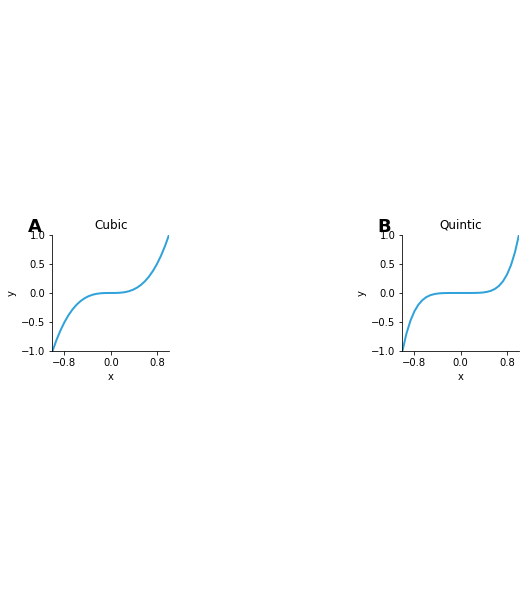

In [2]:
%%output backend='matplotlib'
%%opts Layout [fig_size=60]
%%opts Curve [aspect='equal' xticks=3] 
data=np.linspace(-1.,1.,30)
hv.Curve((data, data**3),label="Cubic") + hv.Empty() + hv.Curve((data, data**5),label='Quintic')
# Ouch, that uses too much space!! Either remove aspect='equal' or hv.Empty() to fix

> Remove A,B (sublabel) with sublabel_format

:Layout
   .Curve.I  :Curve   [x]   (y)
   .Empty.I  :Empty
   .Curve.II :Curve   [x]   (y)
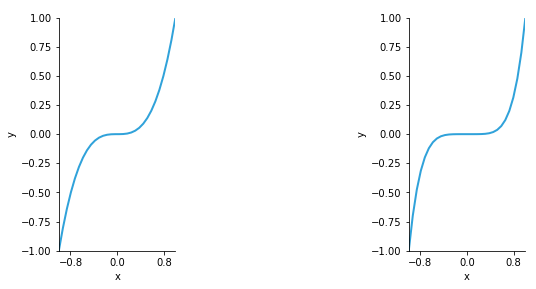

In [3]:
%%output backend='matplotlib'
%%opts Layout [fig_size=60 aspect_weight=0.8 sublabel_format=None]
%%opts Curve [aspect=.5 xticks=3] 

data=np.linspace(-1.,1.,30)
h=hv.Curve((data, data**3))+ hv.Empty() + hv.Curve((data, data**5))
h

##### Colors and Color Cycles

In [37]:
%%opts Curve (color=hv.Cycle(['red', 'green', 'blue']))
x=np.linspace(-1,1,100)
hv.Curve((x,x*x))*hv.Curve((x,x*(x-1)))*hv.Curve((x,1/(1+x*x)))

:Overlay
   .Curve.I   :Curve   [x]   (y)
   .Curve.II  :Curve   [x]   (y)
   .Curve.III :Curve   [x]   (y)

In [38]:
%%opts Curve (color=hv.Cycle('Set1'))
x=np.linspace(-1,1,100)
hv.Curve((x,x*x))*hv.Curve((x,x*(x-1)))*hv.Curve((x,1/(1+x*x)))

:Overlay
   .Curve.I   :Curve   [x]   (y)
   .Curve.II  :Curve   [x]   (y)
   .Curve.III :Curve   [x]   (y)

In [4]:
%%opts Scatter [width=800 height=300 color_index='color' size_index='size']
N    = 40
vals = np.linspace(1.,N,N)
hv.Scatter( (vals,vals**3,vals**2,vals), vdims=['y','color','size'])

:Scatter   [x]   (y,color,size)

##### Twin Axes

:Overlay
   .Curve.I  :Curve   [x]   (A)
   .Curve.II :Curve   [x]   (B)
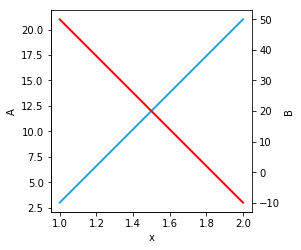

In [4]:
%%output backend='matplotlib'
%%opts Curve [apply_ranges=False]
def twinx(plot, element):
    ax = plot.handles['axis']
    twinax = ax.twinx()
    twinax.set_ylabel(str(element.last.get_dimension(1)))
    plot.handles['axis'] = twinax

a = hv.Curve(([1,2], [3,21]), vdims=['A'])
b = hv.Curve(([1,2], [50, -10]), vdims=['B'])(plot=dict(initial_hooks=[twinx]), style=dict(color='red'))
h = a * b
h.redim.range(x=(0,3))

:Overlay
   .Curve.I  :Curve   [x]   (A)
   .Curve.II :Curve   [x]   (B)
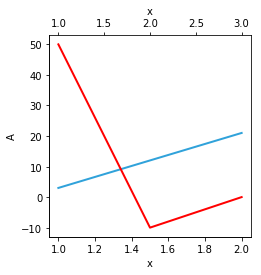

In [5]:
%%output backend='matplotlib'
%%opts Curve [apply_ranges=False]
def twiny(plot, element):
    ax = plot.handles['axis']
    twinax = ax.twiny()
    twinax.set_xlabel(str(element.last.get_dimension(0)))
    plot.handles['axis'] = twinax

a = hv.Curve(([1,2], [3,21]),        kdims=['x'], vdims=['A'])
b = hv.Curve(([1,2,3], [50, -10,0]), kdims=['x'], vdims=['B'])(plot=dict(initial_hooks=[twiny]), style=dict(color='red'))
h = a * b
h.redim.range(x=(0,10))

In [41]:
%%output backend='bokeh'
%%opts Curve [toolbar='above']
from bokeh.models import LinearAxis, Range1d

def twinx(plot, element):
    # Setting the second y axis range name and range
    start, end = (element.range(1))
    label = element.dimensions()[1].pprint_label
    plot.state.extra_y_ranges = {"foo": Range1d(start=start, end=end)}
    # Adding the second axis to the plot. 
    linaxis = LinearAxis(axis_label=label, y_range_name='foo')
    plot.state.add_layout(linaxis, 'right')

a = hv.Curve(([1,2], [3,21]), vdims=['A'])
b = hv.Curve(([1,2], [50, -10]), vdims=['B'])(plot=dict(finalize_hooks=[twinx]), style=dict(color='red'))
h = a * b
h.redim.range(x=(0,3))

:Overlay
   .Curve.I  :Curve   [x]   (A)
   .Curve.II :Curve   [x]   (B)

##### Axis Tick Label Formating

In [42]:
#%%opts Curve [finalize_hooks=[dt_formatter]]

#compute ticks
from bokeh.models import DatetimeTickFormatter
def dt_formatter(plot, element):
    plot.handles['xaxis'].formatter = DatetimeTickFormatter(**{'days': '%d %b'})

hv.Curve((pd.date_range('2017-01-01', '2017-02-01'), range(32))).opts( plot=dict(finalize_hooks=[dt_formatter], yticks=4, width=600, height=150))

:Curve   [x]   (y)

In [43]:
# set ticks from a list
dates = pd.date_range('2017-01-28', '2017-02-06')
ticks = [(int(d.to_datetime64())/ 1000000., d.strftime('%d %b')) for d in dates[::2]]
hv.Curve((dates, range(len(dates)))).opts(plot=dict(xticks=ticks, width=600, height=150))

:Curve   [x]   (y)

##### Area Chart

In [44]:
%%opts Scatter [width=500]( alpha=0.7 size=5)
%%opts Area ( alpha=0.2 color='darkred')

def show_hpds( pts, curve, area1, area2 ):
    h = hv.Scatter(pts)
    if not curve is None: h = h * hv.Curve(curve)
    h = h * hv.Area(area1, vdims=['y1','y2'])*\
            hv.Area(area2, vdims=['y3','y4'])
        
    h = h.redim.range( x=(area2[0].min(), area2[0].max()),
                       y=(0.95*area2[1].min(), 1.05*area2[1].max()))

    return h


def show_howell_data():
    average_weights = (\
        np.array([25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
                    42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
                    59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]),
        np.array([ 133.53,  134.46,  135.38,  136.3 ,  137.23,  138.15,  139.08,
                   140.  ,  140.93,  141.85,  142.77,  143.7 ,  144.62,  145.55,
                   146.47,  147.4 ,  148.32,  149.24,  150.17,  151.09,  152.02,
                   152.94,  153.86,  154.79,  155.71,  156.64,  157.56,  158.49,
                   159.41,  160.33,  161.26,  162.18,  163.11,  164.03,  164.96,
                   165.88,  166.8 ,  167.73,  168.65,  169.58,  170.5 ,  171.43,
                   172.35,  173.27,  174.2 ,  175.12]))
    
    height_vs_weight = (\
        np.array([ 47.83,  36.49,  31.86,  53.04,  41.28,  62.99,  38.24,  55.48, 34.87,  54.49]),
        np.array([ 151.76,  139.7 ,  136.53,  156.84,  145.41,  163.83,  149.22, 168.91,  147.96,  165.1 ]))
    
    mu_hpd_vs_weight = (\
        np.array([25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
                  42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
                  59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]),
        np.array([ 127.45,  128.58,  129.71,  130.25,  131.46,  132.71,  133.47,
                   134.75,  135.8 ,  137.04,  138.57,  139.82,  141.23,  141.56,
                   142.99,  144.24,  145.2 ,  146.09,  147.55,  148.35,  149.64,
                   150.47,  151.38,  151.94,  153.04,  153.48,  153.98,  154.78,
                   155.58,  156.46,  157.32,  158.09,  158.86,  159.58,  159.94,
                   160.48,  161.93,  162.67,  163.47,  164.23,  164.53,  165.29,
                   166.14,  166.86,  167.52,  168.16]),
        np.array([ 140.61,  141.33,  142.05,  142.08,  142.78,  143.52,  143.81,
                   144.42,  144.99,  145.67,  147.01,  147.73,  148.68,  148.81,
                   149.64,  150.46,  151.03,  151.91,  153.03,  153.82,  154.98,
                   155.76,  156.47,  157.18,  158.3 ,  159.35,  160.43,  161.71,
                   162.89,  164.07,  165.28,  166.51,  167.74,  168.91,  169.7 ,
                   170.72,  172.68,  173.78,  175.14,  176.39,  177.28,  178.6 ,
                   180.07,  181.31,  182.54,  183.85]))
    pred_weight_hpd = (\
        np.array([ 31.86,  34.87,  36.49,  38.24,  41.28,  47.83,  53.04,  54.49, 55.48,  62.99]),
        np.array([ 126.07,  129.64,  133.55,  135.95,  138.21,  144.75,  149.6 , 152.26,  150.97,  160.2 ]),
        np.array([ 149.22,  150.92,  153.41,  153.82,  159.24,  162.39,  166.13, 172.88,  172.06,  182.69]))     

    return show_hpds( height_vs_weight, average_weights, 
                      mu_hpd_vs_weight, pred_weight_hpd )
show_howell_data().redim(x=('x','weight'),y=('y','height')).relabel(label="89% HPD for Ave Height / Weight and for Height / Weight")

:Overlay
   .Scatter.I :Scatter   [x]   (y)
   .Curve.I   :Curve   [x]   (y)
   .Area.I    :Area   [x]   (y1,y2)
   .Area.II   :Area   [x]   (y3,y4)

##### Contours
* http://holoviews.org/Tutorials/Showcase.html   (contours, thresholds, ...)
* http://holoviews.org/Tutorials/Options.html    (options for images)

In [45]:
%%output backend='bokeh'
%%opts Polygons (cmap='fire')
from holoviews.operation import contours as hv_contours

x,y = np.meshgrid(np.linspace(-5,5,101), np.linspace(5,-5,101))
z=np.sin(x**2+y**2)*np.exp(-0.3*x)
hv.Image(z)+hv_contours(hv.Image(z), levels=[.2,.4,.6,.7,.85], filled=True, overlaid=False)

:Layout
   .Image.I :Image   [x,y]   (z)
   .Level.I :NdOverlay   [Levels]
      :Polygons   [x,y]   (z)

In [46]:
%%output backend='bokeh'
%%opts NdOverlay Polygons [shared_axes=False]
%%opts Contours (color='k')
%%opts Polygons (cmap='coolwarm_r')

# the colorbar makes little sense with the fill option
#     unless one sets the same colormap for the Image and the Polygons
from holoviews.operation import contours as hv_contours

x,y = np.meshgrid(np.linspace(-5,5,101), np.linspace(5,-5,101))
z=np.sin(x**2+y**2)*np.exp(-0.3*x)
hv.Histogram(*np.histogram(z.flatten(), 30))+\
hv_contours(hv.Image(z), levels=[.25,.50,.75], filled=False, overlaid=False)

:Layout
   .Histogram.I :Histogram   [x]   (Frequency)
   .Level.I     :NdOverlay   [Levels]
      :Contours   [x,y]   (z)

##### HoloMaps and Dynamic Maps
Further information in Tutorials/Dynamic_Map.ipynb

In [47]:
def show_a_holomap():
    def ith():
        x_vals = np.linspace(0,1,10)
        h1 = hv.Curve( (x_vals,np.random.uniform(-2,2,size=10)))
        h2 = hv.Curve( (x_vals,np.random.uniform(-2,2,size=10)))
        # must wrap in an overlay before adding to a holomap
        return hv.Overlay([h1,h2])

    # precompute 5 sets of curves
    return hv.HoloMap({ i: ith() for i in range(5)})

show_a_holomap()

:HoloMap   [Default]
   :Overlay
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)

In [48]:
%%output holomap='scrubber'
show_a_holomap()

:HoloMap   [Default]
   :Overlay
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)

In [50]:
def show_a_dynamic_map():
    def ith(b):
        x_vals = np.linspace(0,1,10)
        h1 = hv.Curve( (x_vals,b+np.random.uniform(-2,2,size=10)))
        h2 = hv.Curve( (x_vals,b-np.random.uniform(-2,2,size=10)))(style=dict(color='turquoise'))
        # must wrap in an overlay before adding to a holomap
        return hv.Overlay([h1,h2])
    return hv.DynamicMap( ith, kdims=['b'])
dmap=show_a_dynamic_map()
(dmap[3].relabel(label='b=3')+dmap.select(b=5).relabel(label='b=5'))\
  .relabel(label='Compute 2 Dynamic Maps')

:Layout
   .Overlay.B_equals_3 :Overlay
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)
   .Overlay.B_equals_5 :Overlay
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)

:DynamicMap   [b]
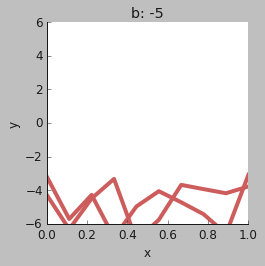

In [51]:
%%output backend="matplotlib"  size=100
%%opts Curve (color='indianred' linewidth=4)
#Note opts on Curve overrides the previously set style options
#Note: the data is cached: Once computed, no more randomness...
dmap=show_a_dynamic_map()
dmap.redim.range(b=(-5.,5.0), y=(-6,6))

In [52]:
%%output backend='bokeh'
%%opts Path [width=400 height=200 shared_axes=False xticks=17]
%%opts Histogram [invert_axes=True height=200 width=200  shared_axes=False xticks=3]

steps      = np.linspace(0.,15., 16)
rwalk      = np.random.uniform(-2, 2, size=(16, 1000))  # Sum{i,j, i=1:16}
rwalk[0,:] = 0.
rwalk    = np.cumsum(rwalk,axis=0)

hists = hv.HoloMap({ i: hv.Histogram( *np.histogram(rwalk[i], 20)).opts(style=dict(fill_color='darkred', alpha=0.4))\
                    for i in range(1,16) }) #range(15,11,-1) })
paths = hv.Path((steps,rwalk), label='1000 Random Walks').opts(style=dict(alpha=0.02, color='darkred'))

paths << hists

:AdjointLayout
   :Path   [x,y]
   :HoloMap   [Default]
      :Histogram   [x]   (Frequency)

##### Controling Axes for Multiple Plots

In [53]:
%%output backend='bokeh' size=80
%%opts Curve [shared_axes=False show_legend=True] (color=Cycle())
%%opts Overlay[legend_position='bottom_right']

h1 = (hv.Curve(  np.random.randn(100), label='c100') * hv.Curve(np.random.randn(100),label='c110')).redim.range(y=(-9,5)).opts(plot=dict(yticks=4))
h2 =  hv.Curve(2*np.random.randn(200), label='c200')
(h1.relabel('Plot 1') + h2.redim.range(y=(-10,10)).relabel('Plot 2 - no legend???')).relabel('TWO PLOTS with Titles and Legends, Different Axes')

:Layout
   .Overlay.Plot_1                                                                :Overlay
      .Curve.C100 :Curve   [x]   (y)
      .Curve.C110 :Curve   [x]   (y)
   .Curve.Plot_2_hyphen_minus_no_legend_question_mark_question_mark_question_mark :Curve   [x]   (y)

In [54]:
%%opts Overlay [legend_position='bottom']
#%%opts Layout [shared_axes=False]
#%%opts Curve {+framewise}
#%%opts Curve {+axiswise}
def show_another_holomap(sz):
    def ith(i):
        x_vals = np.linspace(0,sz,100)
        h1 = hv.Curve( (x_vals,i+sz*np.random.uniform(-2,2,size=100)), label='C1').opts(norm=dict(axiswise=True, framewise=True))
        h2 = hv.Curve( (x_vals,sz+  np.random.uniform(-2,2,size=100)), label='C2').opts(norm=dict(axiswise=True, framewise=True))
        return hv.Overlay([h1,h2]).relabel('Sz = %4.1f'%sz)
    return hv.HoloMap({ i: ith(i) for i in range(5)}, kdims=['Plot_Number'])

#axiswise =True causes hv to normalize data in different axes separately
#framewise=True causes hv to normalize data for each frame separately

if False:
    h=(show_another_holomap(.1)+\
       show_another_holomap(5.)).opts(plot=dict(shared_axes=False))
else:
    h=(show_another_holomap(.1)+\
       show_another_holomap(5.))
    h = h.opts(plot=dict(shared_axes=False))

print(h)
h.relabel('Explore 2 HoloMaps')

:Layout
   .HoloMap.Sz_equals_0_full_stop_1 :HoloMap   [Plot_Number]
      :Overlay
         .Curve.C1 :Curve   [x]   (y)
         .Curve.C2 :Curve   [x]   (y)
   .HoloMap.Sz_equals_5_full_stop_0 :HoloMap   [Plot_Number]
      :Overlay
         .Curve.C1 :Curve   [x]   (y)
         .Curve.C2 :Curve   [x]   (y)


:Layout
   .HoloMap.Sz_equals_0_full_stop_1 :HoloMap   [Plot_Number]
      :Overlay
         .Curve.C1 :Curve   [x]   (y)
         .Curve.C2 :Curve   [x]   (y)
   .HoloMap.Sz_equals_5_full_stop_0 :HoloMap   [Plot_Number]
      :Overlay
         .Curve.C1 :Curve   [x]   (y)
         .Curve.C2 :Curve   [x]   (y)

##### GUIs

In [55]:
%%output backend="bokeh"
%%opts Curve [default_tools=[] tools=['hover']]
class RandomCurvesGUI(hv.streams.Stream):
    index      = param.Integer(default=10,  bounds=(0,10), precedence=-1.)
    amplitude  = param.Number (default=3.0, bounds=(0.,5.))
    dyn_update = param.Boolean(default=False)

    def __init__(self, **params):
        self.x_vals = np.linspace(0,10,10)
        self.update_data(**params)
        super(RandomCurvesGUI, self).__init__( **params )
        
    def update_data(self, **params):
        self.vals1 = np.random.uniform(-self.amplitude,self.amplitude,size=10)
        self.vals2 = np.random.uniform(-self.amplitude,self.amplitude,size=10)

    def get_view(self, **params):
        if self.index is 0 or self.dyn_update is False:
            self.update_data( **params )
        h = hv.Curve( (self.x_vals[0:self.index],self.vals1[0:self.index])) *\
            hv.Curve( (self.x_vals[0:self.index],self.vals2[0:self.index]))

        return h.redim.range( x=(0,10), y=(-8,8))

    def show(self):
        return hv.DynamicMap(hv.Callable(self.get_view, memoize=False), \
                             kdims=[], streams=[self])
%%opts Curve [width=650, height=300]{+framewise}

rc_gui = RandomCurvesGUI()

paramnb.Widgets( rc_gui, callback=rc_gui.event, button=False, next_n=1)  # Note next_n=1
rc_gui.show()

<IPython.core.display.Javascript object>

A Jupyter Widget

:DynamicMap   []

In [56]:
if rc_gui.dyn_update:
    rc_gui.event(index=0)
    for i in range(1,11):
        rc_gui.event(index=i)
        sleep(0.5)

##### Tabs

In [57]:
x = np.linspace(0,10,100)
y = x**2.5
x2 = np.linspace(-1,10,110)
y2 = 2+x2*x2
curve  = hv.Curve((x, y))
curve2 = hv.Curve((x2, y2))
options={'RGB': dict(width=300, height=250, xaxis=None,
                     yaxis=None, show_grid=False)}

datashaded  = datashade(curve, cmap=["blue"])(plot=options)
datashaded2 = datashade(curve2, cmap=["red"])(plot=options)
tabs = (datashaded + datashaded2 + curve2*datashaded)(plot=dict(tabs=True))
tabs

:Layout
   .DynamicMap.I   :DynamicMap   []
   .DynamicMap.II  :DynamicMap   []
   .DynamicMap.III :DynamicMap   []

##### Links

* http://holoviews.org/Tutorials/Elements.html
* http://holoviews.org/Tutorials/Options.html
* http://holoviews.org/Tutorials/Pandas_Seaborn.html